Ceci est le premier notebook pour le projet 6.

Ses objectifs principaux sont d'extraires des features depuis des données texte et image, et de réaliser une étude de faisabilité de catégorisation automatique.

# 1. Introduction

## 1.1 Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import time

#NLTK
import nltk
from nltk.corpus import words
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import *

from autocorrect import Speller

#wordcloud
from wordcloud import WordCloud

#spacy
import spacy

#sklearn
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.metrics import adjusted_rand_score

#gensim
from gensim.models import Word2Vec
from gensim.utils import simple_preprocess

#tensorflow
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import tensorflow_hub as hub
from tensorflow.keras.models import Model
from tensorflow.keras.layers import *

#Pour BERT
from transformers import AutoTokenizer

In [2]:
nlp = spacy.load("en_core_web_sm")

In [3]:
sns.set_theme()

## 1.2 Récupération des données

In [4]:
df = pd.read_csv("flipkart_com-ecommerce_sample_1050.csv")
df.sample(20)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
315,e93cd13f5269dd51b8359ccf93ca5ace,2015-12-01 06:13:00 +0000,http://www.flipkart.com/denver-ro-black-code-g...,"Denver RO,Black Code Gift Set Combo Set","[""Beauty and Personal Care >> Fragrances >> De...",CAGE7CZR6ZD9RT3K,360.0,355.0,e93cd13f5269dd51b8359ccf93ca5ace.jpg,False,"Flipkart.com: Buy Denver RO,Black Code Gift Se...",No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Gift Set C..."
13,189fa66a5fa6f08d2802a62ecf0be298,2015-12-04 07:25:36 +0000,http://www.flipkart.com/titan-1639sl03-analog-...,"Titan 1639SL03 Analog Watch - For Boys, Men","[""Watches >> Wrist Watches >> Titan Wrist Watc...",WATEDBVHQ6AJX7N9,1795.0,1695.0,189fa66a5fa6f08d2802a62ecf0be298.jpg,False,"Titan 1639SL03 Analog Watch - For Boys, Men -...",No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va..."
1049,f2f027ad6a6df617c9f125173da71e44,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-large-vinyl-s...,Uberlyfe Large Vinyl Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE2ZEPACRQJKH7,1190.0,595.0,f2f027ad6a6df617c9f125173da71e44.jpg,False,Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...,4,4,Uberlyfe,"{""product_specification""=>[{""key""=>""Sales Pack..."
880,fc3eb6ffed257270c26943e9f9c347b9,2015-12-20 08:26:17 +0000,http://www.flipkart.com/maspar-cotton-set-towe...,Maspar Cotton Set of Towels,"[""Home Furnishing >> Bath Linen >> Towels""]",BTWDSZQTJTXGBGPU,1645.0,1645.0,fc3eb6ffed257270c26943e9f9c347b9.jpg,False,"Maspar Cotton Set of Towels (One Beach Towel, ...",No rating available,No rating available,Maspar,"{""product_specification""=>[{""key""=>""Material"",..."
385,f2fa99bfaa4aa65a2bd53337e140f949,2015-12-01 06:13:00 +0000,http://www.flipkart.com/archies-vj-580-combo-s...,Archies VJ-580 Combo Set,"[""Beauty and Personal Care >> Fragrances >> De...",CAGE7NK9NNWVPYGZ,418.0,399.0,f2fa99bfaa4aa65a2bd53337e140f949.jpg,False,Flipkart.com: Buy Archies VJ-580 Combo Set onl...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Number of ..."
971,0906fd9cc604fbba05a502e01d763cd9,2016-05-26 12:20:35 +0000,http://www.flipkart.com/sparklings-cotton-geom...,Sparklings Cotton Geometric Double Bedsheet,"[""Baby Care >> Baby Bedding >> Baby Bedsheets ...",BDSEGZCEKFVE5WXY,1199.0,539.0,0906fd9cc604fbba05a502e01d763cd9.jpg,False,Key Features of Sparklings Cotton Geometric Do...,No rating available,No rating available,Sparklings,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
131,de911421573d3e234450040374b55b38,2015-12-01 12:40:44 +0000,http://www.flipkart.com/prithish-word-day-bull...,Prithish Word of The Day: Bullshit Double Colo...,"[""Kitchen & Dining >> Coffee Mugs >> Prithish ...",MUGECEVF6QB99RWA,599.0,225.0,de911421573d3e234450040374b55b38.jpg,False,Prithish Word of The Day: Bullshit Double Colo...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va..."
761,294a26262643797cb07f72f1b55262ae,2015-12-12 11:46:53 +0000,http://www.flipkart.com/perucci-pc-301-analog-...,Perucci PC-301 Analog Watch - For Men,"[""Watches >> Wrist Watches >> Perucci Wrist Wa...",WATE3FAGH3DKJSFC,2500.0,1395.0,294a26262643797cb07f72f1b55262ae.jpg,False,Perucci PC-301 Analog Watch - For Men - Buy P...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va..."
789,389197b67a189c703f3deb9ca6f1f678,2015-12-12 11:46:53 +0000,http://www.flipkart.com/love-baby-cartoon-set-...,Love Baby Cartoon Set of Towels,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWDN9FZJWX4TBMZ,638.0,425.0,389197b67a189c703f3deb9ca6f1f678.jpg,False,Buy Love Baby Cartoon Set of Towels at Rs. 425...,4.3,4.3,Love Baby,"{""product_specification""=>[{""key""=>""Mate

## 1.3 Premières informations

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

Parmi les colonnes qui nous intéresseront réellement, on n'a que des "object". On remarque aussi qu'on n'a pas de valeurs manquantes, excepté une pour les product_specifications.

In [6]:
df.nunique()

uniq_id                    1050
crawl_timestamp             149
product_url                1050
product_name               1050
product_category_tree       642
pid                        1050
retail_price                354
discounted_price            424
image                      1050
is_FK_Advantage_product       2
description                1050
product_rating               27
overall_rating               27
brand                       490
product_specifications      984
dtype: int64

##### Premier constat

On a 642 catégories (targets) pour 1050 produits. Il est impossible d'effectuer un entraînement dans ces conditions. Il faudra simplifier nos catégories.

On constate également grâce à ceci qu'on n'a pas de doublons.

# 2. EDA

## 2.1 Tri sur les colonnes

In [7]:
cols = ["product_name","product_category_tree","image","description","product_specifications"]
df = df[cols]
df.shape

(1050, 5)

## 2.2 Travail autour de la target

La "target", c'est la catégorie du produit.

L'inconvénient, c'est qu'il y a beaucoup trop de sous-catégories. On va rester modestes, et mener notre étude de faisabilité non pas sur le chemin qui va jusqu'à la dernière sous-catégorie, mais plus probablement on s'arrêtera à la première ou la deuxième sous-catégorie rencontrée.

In [8]:
df["product_category_tree"]

0       ["Home Furnishing >> Curtains & Accessories >>...
1       ["Baby Care >> Baby Bath & Skin >> Baby Bath T...
2       ["Baby Care >> Baby Bath & Skin >> Baby Bath T...
3       ["Home Furnishing >> Bed Linen >> Bedsheets >>...
4       ["Home Furnishing >> Bed Linen >> Bedsheets >>...
                              ...                        
1045    ["Baby Care >> Baby & Kids Gifts >> Stickers >...
1046    ["Baby Care >> Baby & Kids Gifts >> Stickers >...
1047    ["Baby Care >> Baby & Kids Gifts >> Stickers >...
1048    ["Baby Care >> Baby & Kids Gifts >> Stickers >...
1049    ["Baby Care >> Baby & Kids Gifts >> Stickers >...
Name: product_category_tree, Length: 1050, dtype: object

### 2.2.1 Passer à une seule sous-catégorie

L'objectif est de réduire drastiquement notre nombre de targets différentes, pour avoir un apprentissage possible.

#### 2.2.1.1 Travail sur un seul élément

In [9]:
cat_1 = df.loc[0, "product_category_tree"]
cat_1

'["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]'

In [10]:
cat_split = cat_1.split(">>")
cat_split[0] + ">>" + cat_split[1] + '"]'

'["Home Furnishing >> Curtains & Accessories "]'

J'ai réussi ce que je souhaitais plus vite que je ne le pensais.

#### 2.2.1.2 Généralisation

In [11]:
def shorten_targets(target):
    
    """ This function allows me to group my targets if their first sub-categories are the same 
    
    ---------------------
    
    arguments :
    target : the target to be shortened
    """
    
    split_target = target.split(">>")
    shortened_target = split_target[0] + ">>" + split_target[1] + '"]'
    return shortened_target

In [12]:
shorten_targets(cat_1)

'["Home Furnishing >> Curtains & Accessories "]'

In [13]:
df["target_1_subcat"] = df.product_category_tree.apply(shorten_targets)

In [14]:
df.head() #On vérifie que tout fonctionne

,product_name,product_category_tree,image,description,product_specifications,target_1_subcat
0,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,"{""product_specification""=>[{""key""=>""Brand"", ""v...","[""Home Furnishing >> Curtains & Accessories ""]"
1,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,"{""product_specification""=>[{""key""=>""Machine Wa...","[""Baby Care >> Baby Bath & Skin ""]"
2,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,"{""product_specification""=>[{""key""=>""Material"",...","[""Baby Care >> Baby Bath & Skin ""]"
3,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,"{""product_specification""=>[{""key""=>""Brand"", ""v...","[""Home Furnishing >> Bed Linen ""]"
4,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,"{""product_specification""=>[{""key""=>""Machine Wa...","[""Home Furnishing >> Bed Linen ""]"


#### 2.2.1.3 Distribution 

In [15]:
distrib = df.target_1_subcat.value_counts()
distrib

["Watches >> Wrist Watches "]                                          149
["Computers >> Laptop Accessories "]                                    87
["Baby Care >> Infant Wear "]                                           84
["Kitchen & Dining >> Coffee Mugs "]                                    74
["Home Decor & Festive Needs >> Showpieces "]                           71
                                                                      ... 
["Home Decor & Festive Needs >> Candles & Fragrances "]                  1
["Kitchen & Dining >> Consumables & Disposables "]                       1
["Home Furnishing >> JMD Home Furnishing "]                              1
["Home Decor & Festive Needs >> TRUE Home Decor & Festive Needs"]"]      1
["Beauty and Personal Care >> Beauty Accessories "]                      1
Name: target_1_subcat, Length: 63, dtype: int64

On est passés de 642 catégories à 63. C'est déjà un bon début. Malheureusement, on a aussi ceci :

In [16]:
distrib.tail(30)

["Home Decor & Festive Needs >> Flowers, Plants & Vases "]             5
["Computers >> Computer Peripherals "]                                 4
["Baby Care >> Baby Grooming "]                                        4
["Home Furnishing >> Living "]                                         4
["Computers >> Tablet Accessories "]                                   3
["Home Decor & Festive Needs >> Religion & Devotion "]                 3
["Kitchen & Dining >> Tableware & Cutlery "]                           3
["Home Furnishing >> Living Room Furnishing "]                         3
["Computers >> Laptops "]                                              2
["Baby Care >> Furniture & Furnishings "]                              2
["Computers >> Storage "]                                              2
["Computers >> Computer Components "]                                  2
["Beauty and Personal Care >> Eye Care "]                              2
["Home Furnishing >> Living"]"]                    

Si on avait beaucoup de données, on aurait peut-être pu tenter une telle catégorisation, mais là, pour une très grande majorité de catégories, on a tellement peu de données qu'il n'est pas du tout envisageable d'essayer.

On va donc se limiter à la catégorie principale, avec zéro sous-catégories affichées.

### 2.2.2 Passer à zéro sous-catégories

#### 2.2.2.1 Sur un seul élément

Reprenons avec

In [17]:
cat_1

'["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]'

In [18]:
cat_split = cat_1.split(" >>")
cat_split[0]

'["Home Furnishing'

Je souhaite enlever le crochet et le guillemet du départ.

In [19]:
p = re.compile(r'\["')
p.sub("",cat_split[0])

'Home Furnishing'

Impeccable !

#### 2.2.2.2 Généralisation sur la colonne

In [20]:
def really_shorten_targets(target):
    
    """ This function allows me to group my targets if their category (not looking at sub categories) are the same 
    
    ---------------------
    
    arguments :
    target : the target to be shortened
    """
    
    split_target = target.split(" >>")
    p = re.compile(r'\["')
    shortened_target = p.sub("",split_target[0])
    
    return shortened_target

In [21]:
df["target"] = df.product_category_tree.apply(really_shorten_targets)

In [22]:
df.head() #On vérifie

,product_name,product_category_tree,image,description,product_specifications,target_1_subcat,target
0,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,"{""product_specification""=>[{""key""=>""Brand"", ""v...","[""Home Furnishing >> Curtains & Accessories ""]",Home Furnishing
1,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,"{""product_specification""=>[{""key""=>""Machine Wa...","[""Baby Care >> Baby Bath & Skin ""]",Baby Care
2,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,"{""product_specification""=>[{""key""=>""Material"",...","[""Baby Care >> Baby Bath & Skin ""]",Baby Care
3,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,"{""product_specification""=>[{""key""=>""Brand"", ""v...","[""Home Furnishing >> Bed Linen ""]",Home Furnishing
4,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,"{""product_specification""=>[{""key""=>""Machine Wa...","[""Home Furnishing >> Bed Linen ""]",Home Furnishing


C'est validé !

#### 2.2.2.3 Distribution

In [23]:
distribution_target = df.target.value_counts()
distribution_target

Home Furnishing               150
Baby Care                     150
Watches                       150
Home Decor & Festive Needs    150
Kitchen & Dining              150
Beauty and Personal Care      150
Computers                     150
Name: target, dtype: int64

Ah !
En effet, c'est *très équilibré* ! 

Il apparaît de manière assez évidente que c'est ce que nous allons utiliser pour la suite.

In [24]:
#Je me sépare des colonnes inutiles
df = df.drop(columns = ["product_category_tree","target_1_subcat"])
df.head()

,product_name,image,description,product_specifications,target
0,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing
1,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care
2,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care
3,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing
4,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing


## 2.3 Tests sur la longueur de la description

Peut-être la longueur de la description est-elle corrélée à la target ? Essayons

In [25]:
df["description_length"] = df.description.str.len()

In [26]:
df.groupby("target").mean()

,description_length
target,
Baby Care,482.613333
Beauty and Personal Care,376.460000
Computers,554.533333
Home Decor & Festive Needs,563.700000
Home Furnishing,379.793333
Kitchen & Dining,633.420000
Watches,326.226667


On relève, certes, des différences sur la moyenne, mais sont-elles réellement significatives ?

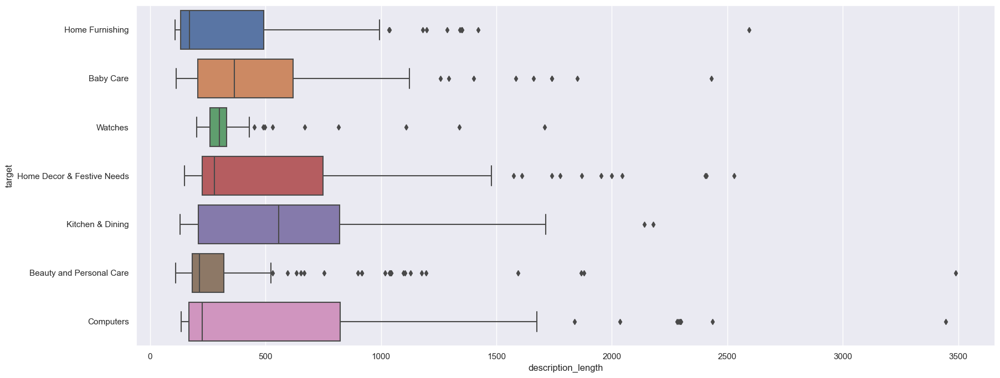

In [27]:
plt.subplots(figsize=(20,8))
ax = sns.boxplot(x="description_length", y="target", data=df)

Au vu de ces boxplots, on peut dire que pour toutes les catégories on a une grande variété de longueurs de desciptions, sauf pour les montres et les produits de beauté, qui sont en général plus courtes.

Essayons un test avec le eta-squared

In [28]:
def eta_squared(x,y): #Ceci est un copier/coller éhonté de la fonction du cours d'OpenClassrooms
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT

In [29]:
eta_squared(df["target"],df["description_length"])

0.05472424930071421

Cette mesure indique une corrélation au mieux modérée entre la longueur de la sdescription et la target.

Dans un souci de respecter l'essence de ce projet, je ne vais pas utiliser la longueur par la suite.

In [30]:
df = df.drop(columns = ["description_length"])

# 3. Nettoyage des données texte

## 3.1 Sur un seul document

In [31]:
doc = df.description.sample(1)
doc = doc.values[0].lower()
doc

'flipkart.com: buy spinz combo set online only for rs. 354 from flipkart.com. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!'

### 3.1.1 Tokenisation

In [32]:
tokenizer = RegexpTokenizer(r"\w+")
tokens = tokenizer.tokenize(doc)
tokens

['flipkart',
 'com',
 'buy',
 'spinz',
 'combo',
 'set',
 'online',
 'only',
 'for',
 'rs',
 '354',
 'from',
 'flipkart',
 'com',
 'only',
 'genuine',
 'products',
 '30',
 'day',
 'replacement',
 'guarantee',
 'free',
 'shipping',
 'cash',
 'on',
 'delivery']

Je vais ajouter une fonction qui me permettra de naviguer dans mon nettoyage, que j'ai déjà utilisée dans un TP.

In [33]:
def display_tokens_info(tokens):
    """display the number of tokens, and the number of unique tokens"""
    
    print(f"nb tokens {len(tokens)}, nb unique tokens {len(set(tokens))}")
    print(tokens[:30])

In [34]:
display_tokens_info(tokens)

nb tokens 26, nb unique tokens 23
['flipkart', 'com', 'buy', 'spinz', 'combo', 'set', 'online', 'only', 'for', 'rs', '354', 'from', 'flipkart', 'com', 'only', 'genuine', 'products', '30', 'day', 'replacement', 'guarantee', 'free', 'shipping', 'cash', 'on', 'delivery']


### 3.1.2 Stopwords

In [35]:
stop_words = set(stopwords.words('english'))

In [36]:
tokens = [w for w in tokens if w not in stop_words]
display_tokens_info(tokens)

nb tokens 21, nb unique tokens 19
['flipkart', 'com', 'buy', 'spinz', 'combo', 'set', 'online', 'rs', '354', 'flipkart', 'com', 'genuine', 'products', '30', 'day', 'replacement', 'guarantee', 'free', 'shipping', 'cash', 'delivery']


### 3.1.3 Correction orthographique

J'ignore si c'est le cas dans ce jeu de données, mais les êtres humains font des fautes d'orthographe et des fautes de frappe.
Essayons de le prendre en compte.

In [37]:
spell = Speller()

print('Spelling Correction:\n')
for token in tokens:
    print(f'{token} => {spell(token)}')

Spelling Correction:

flipkart => flipkart
com => com
buy => buy
spinz => spin
combo => combo
set => set
online => online
rs => rs
354 => 354
flipkart => flipkart
com => com
genuine => genuine
products => products
30 => 30
day => day
replacement => replacement
guarantee => guarantee
free => free
shipping => shipping
cash => cash
delivery => delivery


In [38]:
corrected_tokens = [spell(w) for w in tokens]
display_tokens_info(corrected_tokens)

nb tokens 21, nb unique tokens 19
['flipkart', 'com', 'buy', 'spin', 'combo', 'set', 'online', 'rs', '354', 'flipkart', 'com', 'genuine', 'products', '30', 'day', 'replacement', 'guarantee', 'free', 'shipping', 'cash', 'delivery']


## 3.2 Sur l'ensemble du corpus (colonne "description")

### 3.2.1 Construction dudit corpus

In [39]:
description_corpus = "".join(df.description.values)
description_corpus[:1000]

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

Je commence par appliquer sur ce corpus les modifications que j'avais effectuées dans la partie précédente.

In [40]:
description_corpus = description_corpus.lower()

#tokenizer
tokenizer = RegexpTokenizer(r"\w+")
corpus_tokens = tokenizer.tokenize(description_corpus)

#stopwords
corpus_tokens = [w for w in corpus_tokens if w not in stop_words]

#corrector
#corrected_corpus = [spell(w) for w in corpus_tokens]

#print(f"On avait {len(set(corpus_tokens))} mots uniques avant correction, et {len(set(corrected_corpus))} mots uniques après correction")

" ".join(corpus_tokens)

'key features elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain 213 cm height pack 2 price rs 899 curtain enhances look interiors curtain made 100 high quality polyester fabric features eyelet style stitch metal ring makes room environment romantic loving curtain ant wrinkle anti shrinkage elegant apparance give home bright modernistic appeal designs surreal attention sure steal hearts contemporary eyelet valance curtains slide smoothly draw apart first thing morning welcome bright sun rays want wish good morning whole world draw close evening create special moments joyous beauty given soothing prints bring home elegant curtain softly filters light room get right amount sunlight specifications elegance polyester multicolor abstract eyelet door curtain 213 cm height pack 2 general brand elegance designed door type eyelet model name abstract polyester door curtain set 2 model id duster25 color multicolor d

C'est un peu long à l'exécution, mais cela reste raisonnable.

De plus, on observe que certains de nos mots avaient en effet besoin d'être corrigés.

In [41]:
display_tokens_info(corpus_tokens)

nb tokens 61452, nb unique tokens 6165
['key', 'features', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', '213', 'cm', 'height', 'pack', '2', 'price', 'rs', '899', 'curtain', 'enhances', 'look', 'interiors']


In [42]:
#J'observe le nombre d'occurences des mots dans mon corpus
temp = pd.Series(corpus_tokens).value_counts()
temp

rs           911
products     631
free         618
delivery     567
cash         564
            ... 
drawerkey      1
680            1
roundbuy       1
homeehub       1
dell           1
Length: 6165, dtype: int64

In [43]:
temp.describe() #je souhaite quelques informations supplémentaires sur mes occurences

count    6165.000000
mean        9.967883
std        38.897271
min         1.000000
25%         1.000000
50%         2.000000
75%         5.000000
max       911.000000
dtype: float64

C:\Users\Yann\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


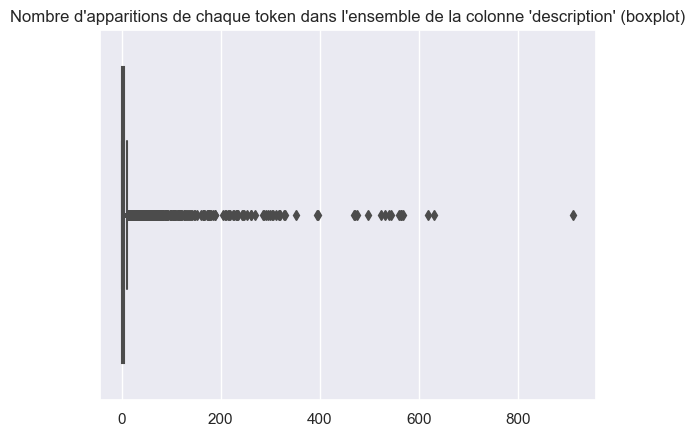

In [44]:
#Et graphiquement, cela donne :
sns.boxplot(temp)
plt.title("Nombre d'apparitions de chaque token dans l'ensemble de la colonne 'description' (boxplot)")
plt.show()

La majorité écrasante apparaît peu, mais on a aussi beaucoup de mots avec une fréquence très élevée.

In [45]:
#Je souhaite aussi visualiser mes mots les plus fréquents
temp.head(30)

rs                911
products          631
free              618
delivery          567
cash              564
genuine           564
shipping          564
replacement       559
buy               543
day               540
cm                532
1                 524
30                498
flipkart          475
guarantee         471
com               468
online            396
features          395
price             352
watch             329
color             328
baby              320
mug               318
pack              317
material          312
set               306
type              304
cotton            299
specifications    295
box               291
dtype: int64

Honnêtement, les 15 mots les plus fréquents n'ont pas l'air très pertinents pour décider d'une catégorie.
Je m'abstiens de trop commenter pour l'instant, car on est loin d'en avoir terminé avec le nettoyage.

### 3.2.2 tokens rares

Certains tokens (une majorité en fait, d'après mon describe ci-dessus) sont trop rares pour être intéressants sur un entraînement. Je vais donc les supprimer.

In [46]:
rare_tokens = temp.loc[temp <= 2]
rare_tokens

pokizo       2
knows        2
deluxe       2
prestige     2
birds        2
            ..
drawerkey    1
680          1
roundbuy     1
homeehub     1
dell         1
Length: 3446, dtype: int64

In [47]:
list_rare_tokens = rare_tokens.index
list_rare_tokens

Index(['pokizo', 'knows', 'deluxe', 'prestige', 'birds', 'thus', 'styles',
       '880', 'dean', 'stage',
       ...
       'needybee', '752dru', 'susceptible', 'linespecifications', 'esteem',
       'drawerkey', '680', 'roundbuy', 'homeehub', 'dell'],
      dtype='object', length=3446)

In [48]:
corpus_rareless = [w for w in corpus_tokens if w not in list_rare_tokens]
display_tokens_info(corpus_rareless)

nb tokens 56674, nb unique tokens 2719
['key', 'features', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', '213', 'cm', 'height', 'pack', '2', 'price', 'rs', '899', 'curtain', 'enhances', 'look', 'interiors']


### 3.2.3 seulement des mots anglais

J'ai aussi constaté, avec "temp", que certains mots ne sont pas du tout anglais. Par exemple "rs" qui est le mot le plus fréquent, mais aussi tous les nombres. Il y en a certainement d'autres, possiblement liés à la présence de liens dans les descriptions.

In [49]:
#Ceci est la liste du dictionnaire anglais
words.words()

['A',
 'a',
 'aa',
 'aal',
 'aalii',
 'aam',
 'Aani',
 'aardvark',
 'aardwolf',
 'Aaron',
 'Aaronic',
 'Aaronical',
 'Aaronite',
 'Aaronitic',
 'Aaru',
 'Ab',
 'aba',
 'Ababdeh',
 'Ababua',
 'abac',
 'abaca',
 'abacate',
 'abacay',
 'abacinate',
 'abacination',
 'abaciscus',
 'abacist',
 'aback',
 'abactinal',
 'abactinally',
 'abaction',
 'abactor',
 'abaculus',
 'abacus',
 'Abadite',
 'abaff',
 'abaft',
 'abaisance',
 'abaiser',
 'abaissed',
 'abalienate',
 'abalienation',
 'abalone',
 'Abama',
 'abampere',
 'abandon',
 'abandonable',
 'abandoned',
 'abandonedly',
 'abandonee',
 'abandoner',
 'abandonment',
 'Abanic',
 'Abantes',
 'abaptiston',
 'Abarambo',
 'Abaris',
 'abarthrosis',
 'abarticular',
 'abarticulation',
 'abas',
 'abase',
 'abased',
 'abasedly',
 'abasedness',
 'abasement',
 'abaser',
 'Abasgi',
 'abash',
 'abashed',
 'abashedly',
 'abashedness',
 'abashless',
 'abashlessly',
 'abashment',
 'abasia',
 'abasic',
 'abask',
 'Abassin',
 'abastardize',
 'abatable',
 'abate

In [50]:
#Comme j'ai effectué un lower() sur mon corpus, je le fais ici aussi
eng_words = [w.lower() for w in words.words()]

In [51]:
engl_corpus = [w for w in corpus_rareless if w in eng_words]
display_tokens_info(engl_corpus)

nb tokens 38878, nb unique tokens 1599
['key', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'price', 'curtain', 'look', 'curtain', 'made', 'high', 'quality', 'polyester', 'fabric', 'eyelet', 'style']


Ceci prend à nouveau un certain temps, mais raisonnable. Cela réduit considérablement notre corpus.

In [52]:
pd.Series(engl_corpus).value_counts()

free          618
delivery      567
shipping      564
genuine       564
cash          564
             ... 
snug            3
innovation      3
needle          3
flow            3
drift           3
Length: 1599, dtype: int64

On s'aperçoit qu'on a en effet perdu le mot "rs" (qui était premier au value count), par exemple.

### 3.2.4 Lemmatisation

In [53]:
lem = WordNetLemmatizer()
lem_corpus = [lem.lemmatize(w) for w in engl_corpus]
display_tokens_info(lem_corpus)

nb tokens 38878, nb unique tokens 1575
['key', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'price', 'curtain', 'look', 'curtain', 'made', 'high', 'quality', 'polyester', 'fabric', 'eyelet', 'style']


## 3.3 Nettoyage effectif

Après avoir travaillé sur l'ensemble du corpus, je m'en sers pour créer un outil de nettoyage commplet.

In [54]:
def clean_text(text):
    
    """ lowers, tokenizes, removes stopwords, autocorrects, lemmatizes,
    removes rare tokens and non english words, also removes too short tokens
    
    --------------------------------------------
    
    arguments :
    
    text : string. the text that needs cleaning
    
    
    """
    
    #lower
    lower_text = text.lower()
    
    #tokenize
    tokenizer = RegexpTokenizer(r"\w+")
    tokens = tokenizer.tokenize(lower_text)
    
    #remove stopwords
    tokens = [w for w in tokens if w not in stop_words]
    
    #autocorrect
    # correct_tokens = [spell(w) for w in nostop_tokens]
    
    #only english words
    tokens = [w for w in tokens if w in eng_words]
    
    #lemmatize
    lem = WordNetLemmatizer()
    tokens = [lem.lemmatize(w) for w in tokens]
    
    #remove rare tokens
    tokens = [w for w in tokens if w not in list_rare_tokens]
    
    #remove too short tokens
    new_text = [w for w in tokens if len(w) >= 3]
    
    
    return new_text

In [55]:
#test sur le corpus précédent
clean_corpus = clean_text(description_corpus)
display_tokens_info(clean_corpus)

nb tokens 38194, nb unique tokens 1555
['key', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'price', 'curtain', 'look', 'curtain', 'made', 'high', 'quality', 'polyester', 'fabric', 'eyelet', 'style']


On a un peu plus de mots que dans le chapitre précédents, parce que j'ai lemmatisé avant de vérifier les tokens rares, là où c'était dans l'ordre inverse tout à l'heure.

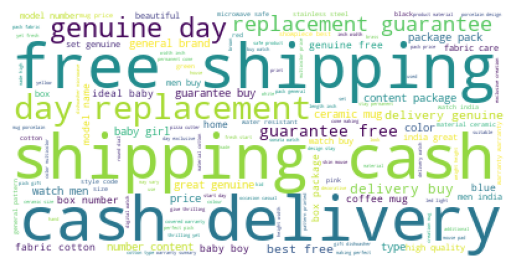

In [56]:
wordcloud = WordCloud(background_color = 'white',
                     max_words = 500).generate(" ".join(clean_corpus))

plt.imshow(wordcloud)
plt.axis("off")
plt.show()

## 3.4 Séparation selon la target

Je souhaite séparer mon corpus en fonction de la catégorie associée.

De cette manière, je pourrai, à l'aide de wordclouds (ou de value counts), constater pour chaque catégorie quels sont les mots les plus employés.

Si certains mots sont trop présents dans l'intégralité des catégories, on les bannira potentiellement.

### 3.4.1 Construction des différents corpus

In [57]:
#On sépare le dataframe selon les targets
df_home_furnishing = df[df.target == "Home Furnishing"]
df_baby_care = df[df.target == "Baby Care"]
df_watches = df[df.target == "Watches"]
df_home_decor = df[df.target == "Home Decor & Festive Needs"]
df_kitchen_dining = df[df.target == "Kitchen & Dining"]
df_beauty = df[df.target == "Beauty and Personal Care"]
df_computers = df[df.target == "Computers"]

#On récupère les différents corpus
corpus_home_furnishing = " ".join(df_home_furnishing.description)
corpus_baby_care = " ".join(df_baby_care.description)
corpus_watches = " ".join(df_watches.description)
corpus_home_decor = " ".join(df_home_decor.description)
corpus_kitchen_dining = " ".join(df_kitchen_dining.description)
corpus_beauty = " ".join(df_beauty.description)
corpus_computers = " ".join(df_computers.description)

In [58]:
#On cleane tous les corpus
corpus_home_furnishing = clean_text(corpus_home_furnishing)
corpus_baby_care = clean_text(corpus_baby_care)
corpus_watches = clean_text(corpus_watches)
corpus_home_decor = clean_text(corpus_home_decor)
corpus_kitchen_dining = clean_text(corpus_kitchen_dining)
corpus_beauty = clean_text(corpus_beauty)
corpus_computers = clean_text(corpus_computers)

### 3.4.2 WordClouds

#### 3.4.2.1 Home Furnishing

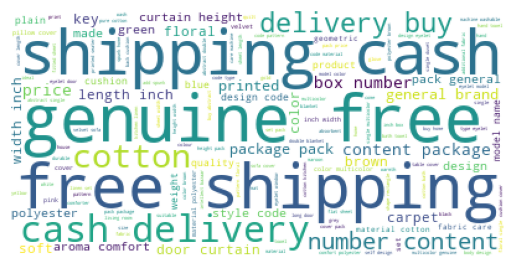

In [59]:
wordcloud = WordCloud(background_color = 'white',
                     max_words = 200).generate(" ".join(corpus_home_furnishing))

plt.imshow(wordcloud)
plt.axis("off")
plt.show()

Avant de passer aux autres catégories, on remarque bien évidemment que les mots écrits en police énorme sont les mêmes que dans le corpus global.

En revanche, on note aussi l'apparition de certains tokens spécifiques à la catégorie, comme "cushion", "design", "cotton", ou encore "blanket", par exemple.

In [60]:
#Regardons sans aide graphique
pd.Series(corpus_home_furnishing).value_counts().head(20)

cotton        103
pack           88
cover          84
buy            77
design         76
free           76
delivery       74
genuine        74
shipping       74
cash           74
color          66
package        63
polyester      61
material       58
inch           58
single         57
price          54
multicolor     54
width          49
printed        47
dtype: int64

Comme constaté ci-dessus, on a bien du vocabulaire proche de la catégorie qui apparaît dans les première positions.

Toutefois, on a aussi des mots "génériques" candidats au bannissement (buy, product, pack, free, delivery, shipping, cash, price...)

#### 3.4.2.2 Baby Care

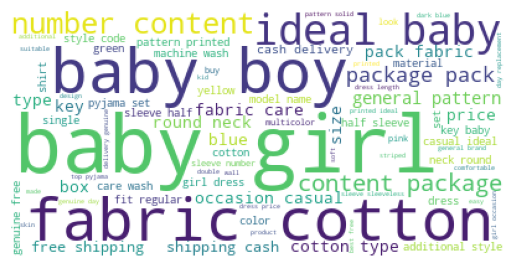

In [61]:
wordcloud = WordCloud(background_color = 'white',
                     max_words = 200).generate(" ".join(corpus_baby_care))

plt.imshow(wordcloud)
plt.axis("off")
plt.show()

Cette fois-ci, on a plus les termes génériques "free delivery" qui apparaissent en premier, mais beaucoup de termes spécifiques à la catégorie. "Baby" est naturellement très présent.

In [62]:
pd.Series(corpus_baby_care).value_counts().head(30)

baby        316
cotton      191
girl        165
fabric      164
dress       105
ideal        98
general      96
boy          92
package      88
type         81
color        81
neck         80
sleeve       80
wash         77
number       76
pattern      75
pack         74
content      74
box          67
printed      66
shirt        61
key          60
set          59
casual       59
price        57
length       55
fit          55
blue         52
care         51
occasion     50
dtype: int64

Même en affichant les 30 premiers termes au lieu des 20 premiers, je ne retrouve que peu de mes termes affichés pour la première catégorie (pack, package, price, product).

#### 3.4.2.3 Watches

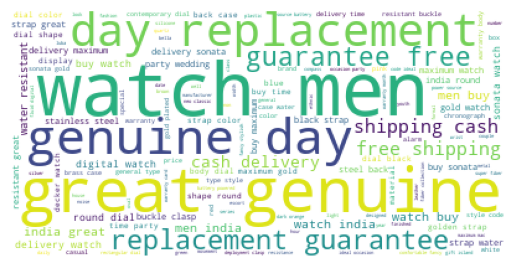

In [63]:
wordcloud = WordCloud(background_color = 'white',
                     max_words = 200).generate(" ".join(corpus_watches))

plt.imshow(wordcloud)
plt.axis("off")
plt.show()

On dirait que cette catégorie est particulièrement sujette au DISCOUNT.
C'est particulièrement intéressant, car je n'aurais pas naturellement associé "Discount" à "Watches". Cela me fait remettre en question fortement l'idée de bannir certains mots qui n'ont pas forcément de lien sémantique avec la catégorie.

In [64]:
pd.Series(corpus_watches).value_counts().head(20)

watch          324
men            158
day            136
buy            134
india          134
great          134
genuine        134
replacement    134
guarantee      134
free           134
shipping       134
cash           134
delivery       134
dial            90
strap           79
water           51
resistant       51
round           50
sonata          47
maximum         46
dtype: int64

On retrouve beaucoup de termes "génériques" ici. (product, delivery, cash, shipping, free...)
Petite remarque sur le mot "watch" qui apparait plus de 2 fois par annonce. Dommage qu'il signifie aussi autre chose en anglais et qu'on ait donc des chances de le retrouver ailleurs.

#### 3.4.2.4 Home Decor & Festive Needs

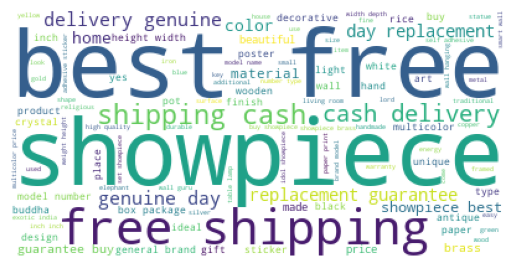

In [65]:
wordcloud = WordCloud(background_color = 'white',
                     max_words = 200).generate(" ".join(corpus_home_decor))

plt.imshow(wordcloud)
plt.axis("off")
plt.show()

Particulièrement peu de mots ressortent de cette catégorie, excepté bien sûr le "SHOWPIECE" écrit en énorme.

In [66]:
pd.Series(corpus_home_decor).value_counts().head(20)

showpiece      204
best            87
day             84
free            83
buy             82
delivery        77
genuine         76
replacement     76
shipping        76
cash            76
guarantee       76
home            75
wall            74
inch            74
color           71
price           68
brass           63
number          57
box             51
material        51
dtype: int64

On retrouve à nouveau beaucoup de mots génériques

#### 3.4.2.5 Kitchen & Dining

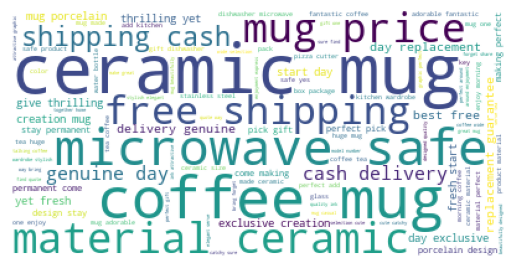

In [67]:
wordcloud = WordCloud(background_color = 'white',
                     max_words = 200).generate(" ".join(corpus_kitchen_dining))

plt.imshow(wordcloud)
plt.axis("off")
plt.show()

Cette fois-ci, comme pour la catégorie "Baby care", on a tellement de mots propres à la catégorie qui ont beaucoup d'occurences, qu'on a presque complètement éclipsé les mots génériques. Seul "free shipping" fait de la résistance.

In [68]:
pd.Series(corpus_kitchen_dining).value_counts().head(20)

mug         323
ceramic     206
coffee      161
perfect     143
material    119
day          98
design       89
price        88
gift         87
safe         81
quality      72
pack         70
give         68
best         65
product      62
come         60
kitchen      58
free         58
one          57
buy          57
dtype: int64

Au-delà du vocabulaire de la maison, on a beaucoup d'adjectifs superlatifs. "Best, Perfect, Quality, Thrilling"...

#### 3.4.2.6 Beauty and Personal Care

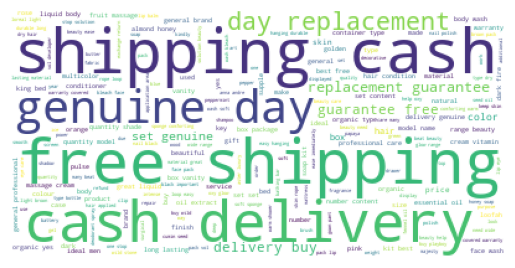

In [69]:
wordcloud = WordCloud(background_color = 'white',
                     max_words = 200).generate(" ".join(corpus_beauty))

plt.imshow(wordcloud)
plt.axis("off")
plt.show()

On est de retour sur les mots génériques qui ont totalement pris le pouvoir ici.

In [70]:
pd.Series(corpus_beauty).value_counts().head(20)

set            112
free           110
replacement    105
delivery       103
day            102
guarantee      101
genuine        101
cash           101
shipping       101
buy            101
skin            69
hair            52
box             49
type            44
color           42
oil             37
body            35
price           34
pack            30
product         29
dtype: int64

C'est terrifiant pour la suite. Le premier mot spécifique à la catégorie, "skin", ne figure qu'en... 13e position !

#### 3.4.2.7 Computers

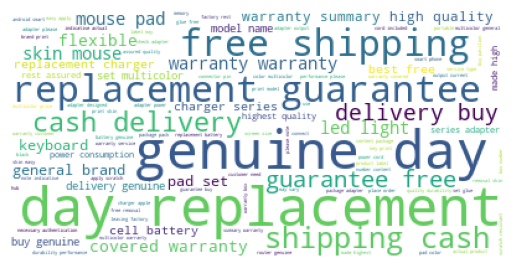

In [71]:
wordcloud = WordCloud(background_color = 'white',
                     max_words = 200).generate(" ".join(corpus_computers))

plt.imshow(wordcloud)
plt.axis("off")
plt.show()

Encore une fois, beaucoup de mots génériques. (Avec tout de même une emphase sur "replacement" et "guarantee").

In [72]:
pd.Series(corpus_computers).value_counts().head(20)

replacement    176
warranty       159
adapter        116
free           112
battery        106
power          101
guarantee       96
day             96
buy             95
delivery        94
cash            94
genuine         94
shipping        94
quality         90
skin            72
light           67
charger         62
product         60
model           58
brand           58
dtype: int64

C'est drôle, les deux premiers mots sont justement les deux que j'ai cités (je compte guarantee et warranty ensemble).
Je m'étonne de voir que "skin" est utilisé plus de fois dans cette catégorie que dans la précédente !

In [73]:
banned_words = []
# banned_words = ["product","buy","genuine","shipping","free","delivery","price","day","cash","design","pack","genuin","packag",
#                "color","inch","key","brand","materi","guarante","ship"]

### 3.4.3 Conclusion

Finalement, et à cause d'un manque d'homogénéité dans mes groupes, je choisis de ne pas utiliser de "ban-words" (J'ai fait quelques tests avec et sans, et ils n'apportent pas de résultats supplémentaires). Après tout, ce sera le rôle de la vectorisation de séparer les mots présents trop fréquemment des mots uniques (avec le Tf-Idf, par exemple).

# 3.5 Nettoyage finalisé

In [74]:
def final_clean(text):
    """
    takes a raw corpus and cleans it entirely
    """
    
    #on utilise la fonction précédente
    new_text = clean_text(text)
    
    #on retire les mots bannis (s'il y en a)
    new_text = [w for w in new_text if w not in banned_words]
    
    #on rejoin les tokens
    final_text = " ".join(new_text)
    
    return final_text

Maintenant, on applique cette fonction à la colonne "description" + la colonne "product_name" pour obtenir une colonne cleanée.

In [75]:
#regroupement des colonnes
df["for_final_clean"] = df["product_name"] + " " + df["description"]

#application de la fonction de cleaning
df["clean_description"] = df.for_final_clean.apply(final_clean)

In [76]:
df.sample(10)

,product_name,image,description,product_specifications,target,for_final_clean,clean_description
484,Clublaptop Lenovo L08O6C02 6 Cell Laptop Battery,bb18279e9885136f1dbc8676d4af94e3.jpg,Clublaptop Lenovo L08O6C02 6 Cell Laptop Batte...,"{""product_specification""=>[{""key""=>""In The Box...",Computers,Clublaptop Lenovo L08O6C02 6 Cell Laptop Batte...,cell battery cell battery price life replaceme...
267,Sahara Q Shop Kadhai 1.5 L,86dcb7d4ce6ec7bfb3e26d1bd859f4fb.jpg,Sahara Q Shop Kadhai 1.5 L (Stainless Steel)\r...,"{""product_specification""=>[{""key""=>""Pan Type"",...",Kitchen & Dining,Sahara Q Shop Kadhai 1.5 L Sahara Q Shop Kadha...,sahara shop sahara shop stainless steel price ...
558,Times SD_147 Casual Analog Watch - For Women,ae03731c3482a5e42d040dbf723c49af.jpg,Times SD_147 Casual Analog Watch - For Women ...,"{""product_specification""=>[{""key""=>""Chronograp...",Watches,Times SD_147 Casual Analog Watch - For Women ...,time casual watch time casual watch buy time c...
667,RTD Baby Girl's Kurta and Pyjama Set,5eec66ec172ce096cd4e5c947686b56a.jpg,RTD Baby Girl's Kurta and Pyjama Set - Buy Yel...,"{""product_specification""=>[{""key""=>""Sleeve"", ""...",Baby Care,RTD Baby Girl's Kurta and Pyjama Set RTD Baby ...,baby girl pyjama set baby girl pyjama set buy ...
715,Pioneer Pragati Floral Single Duvet Orange,d68b774e9529a4b94a5c6c8943a1b8b3.jpg,Pioneer Pragati Floral Single Duvet Orange (1 ...,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing,Pioneer Pragati Floral Single Duvet Orange Pio...,pioneer floral single duvet orange pioneer flo...
1015,PRINT SHAPES red Heart Laptop Skin with Mouse ...,eeecf5d16fa6591290706f1fd0c6fc6e.jpg,Key Features of PRINT SHAPES red Heart Laptop ...,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Computers,PRINT SHAPES red Heart Laptop Skin with Mouse ...,print red heart skin mouse pad set key print r...
378,"Engage Rush , Jump Combo Set",955abcd11312fce2fd02a91a9b05ae71.jpg,"Flipkart.com: Buy Engage Rush , Jump Combo Set...","{""product_specification""=>[{""key""=>""Number of ...",Beauty and Personal Care,"Engage Rush , Jump Combo Set Flipkart.com: Buy...",engage set buy engage set genuine day replacem...
321,Apple MD199HN/A,5df72b5295dc5e6126693e640b50f3a2.jpg,Buy Apple MD199HN/A only for Rs. 5900 from Fli...,"{""product_specification""=>[{""key""=>""Wireless S...",Computers,Apple MD199HN/A Buy Apple MD199HN/A only for R...,apple buy apple genuine day replacement guaran...
291,MKB Baby Girl's Shirt Dress,8876d7569efdaff5a21b33a1ab44a13d.jpg,Key Features of MKB Baby Girl's Shirt Dress Ma...,"{""product_specification""=>[{""value""=>""1 Dress""...",Baby Care,MKB Baby Girl's Shirt Dress Key Features of MK...,baby girl shirt dress key baby girl shirt dres...
74,Vitamins Graphic Print Baby Girl's Basic Shorts,7a3f11f380a1bf85338ab3771ff81e9f.jpg,Key Features of Vitamins Graphic Print Baby Gi...,"{""product_specification""=>[{""key""=>""Ideal For""...",Baby Care,Vitamins Graphic Print Baby Girl's Basic Short...,graphic print baby girl basic short key graphi...


Tout fonctionne.

# 4. Vectorisation et étude de faisabilité

Maintenant qu'on a cleané notre corpus, on veut transformer notre description en quelque chose qui soit interprétable par une machine : un vecteur (ou bien plusieurs vecteurs qu'on regroupe en matrice, selon la méthode)

On va employer plusieurs méthodes de vectorisation, mais à chaque fois, on va procéder ainsi :

- On vectorise selon la méthode choisie

- On effectue un clustering (K-means) avec 7 clusters (on a 7 targets) sur nos données texte

- On effectue une projection en deux dimensions à l'aide d'un t-SNE, sur lequel on effectue deux affichages : un avec le clustering, un avec les catégories réelles (pour visualiser)

- On calcule le score ARI entre notre clustering et les catégories réelles.

In [77]:
df_test = df[["clean_description","target"]]
df_test.head()

,clean_description,target
0,elegance polyester multicolor abstract eyelet ...,Home Furnishing
1,cotton bath towel cotton bath towel bath towel...,Baby Care
2,cotton terry face towel set key cotton terry f...,Baby Care
3,royal fashion cotton printed king sized double...,Home Furnishing
4,print cotton floral king sized double key prin...,Home Furnishing


Pour la suite, on a besoin d'encoder notre target.

In [78]:
encoder = LabelEncoder()
df_test["label"] = encoder.fit_transform(df_test["target"])
df_test.head()

C:\Users\Yann\AppData\Local\Temp\ipykernel_3064\3930608656.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test["label"] = encoder.fit_transform(df_test["target"])


,clean_description,target,label
0,elegance polyester multicolor abstract eyelet ...,Home Furnishing,4
1,cotton bath towel cotton bath towel bath towel...,Baby Care,0
2,cotton terry face towel set key cotton terry f...,Baby Care,0
3,royal fashion cotton printed king sized double...,Home Furnishing,4
4,print cotton floral king sized double key prin...,Home Furnishing,4


## 4.1 Bag-of-words simple

Commençons, pour démarrer, avec un CountVectorizer simple.

In [79]:
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(df_test["clean_description"])

In [80]:
X.shape

(1050, 1559)

In [81]:
kmeans = KMeans(n_clusters = 7)
df_test["predicted_cluster"] = kmeans.fit_predict(X)
df_test.sample(20)

C:\Users\Yann\AppData\Local\Temp\ipykernel_3064\1256502524.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test["predicted_cluster"] = kmeans.fit_predict(X)


,clean_description,target,label,predicted_cluster
43,burt bee hair repair shea grapefruit deep cond...,Beauty and Personal Care,1,1
852,portable flexible led light lamp led light por...,Computers,2,1
880,cotton set cotton set one beach towel red pric...,Home Furnishing,4,1
17,north silicone digital watch north silicone di...,Watches,6,5
459,bed head colour goddess oil conditioner key be...,Beauty and Personal Care,1,1
580,sonata watch men sonata watch men buy sonata w...,Watches,6,5
945,floral double blanket multicolor buy floral do...,Home Furnishing,4,0
195,sandalwood chinese queen big showpiece buy san...,Home Decor & Festive Needs,3,0
879,set buy set genuine free shipping cash delivery,Home Furnishing,4,0
512,pavilion cell battery pavilion cell battery pr...,Computers,2,1


In [82]:
#Voyons les effectifs de chaque cluster.
df_test.predicted_cluster.value_counts()

0    466
1    359
5    144
4     55
2     12
6      7
3      7
Name: predicted_cluster, dtype: int64

On est vraiment très, très loin d'un bon résultat...

In [83]:
#Pour la visualisation
tsne = TSNE(n_jobs = -1)
X_tsne = tsne.fit_transform(X)

C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


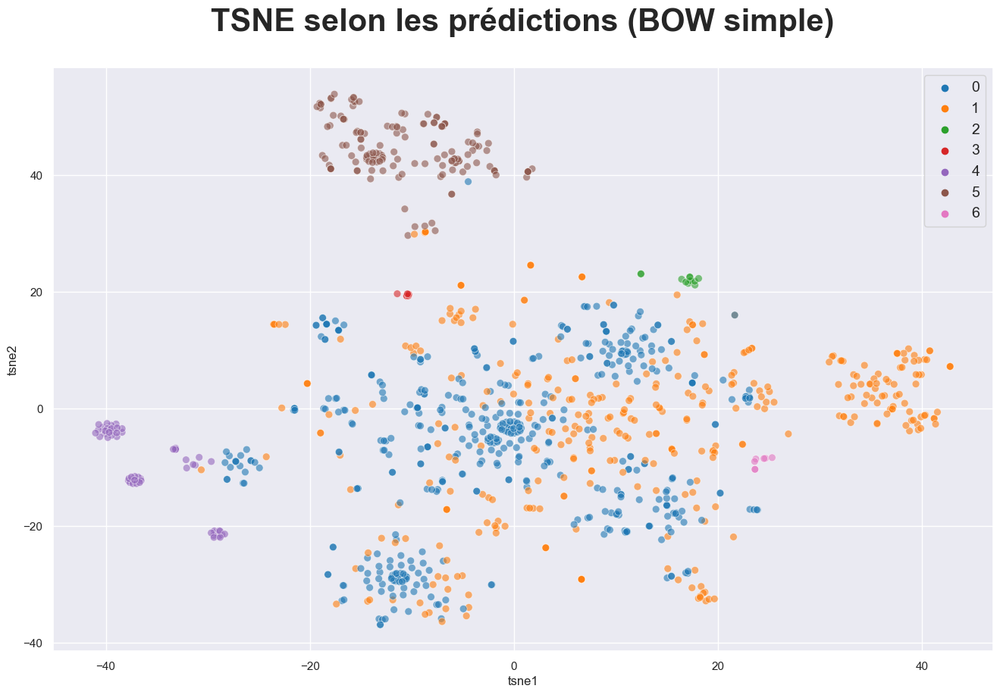

In [84]:
df_tsne = pd.DataFrame(X_tsne, columns=['tsne1', 'tsne2'])
df_tsne["class"] = df_test["predicted_cluster"]
df_tsne["target"] = df_test["target"]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="class",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les prédictions (BOW simple)', fontsize = 30, pad = 35, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

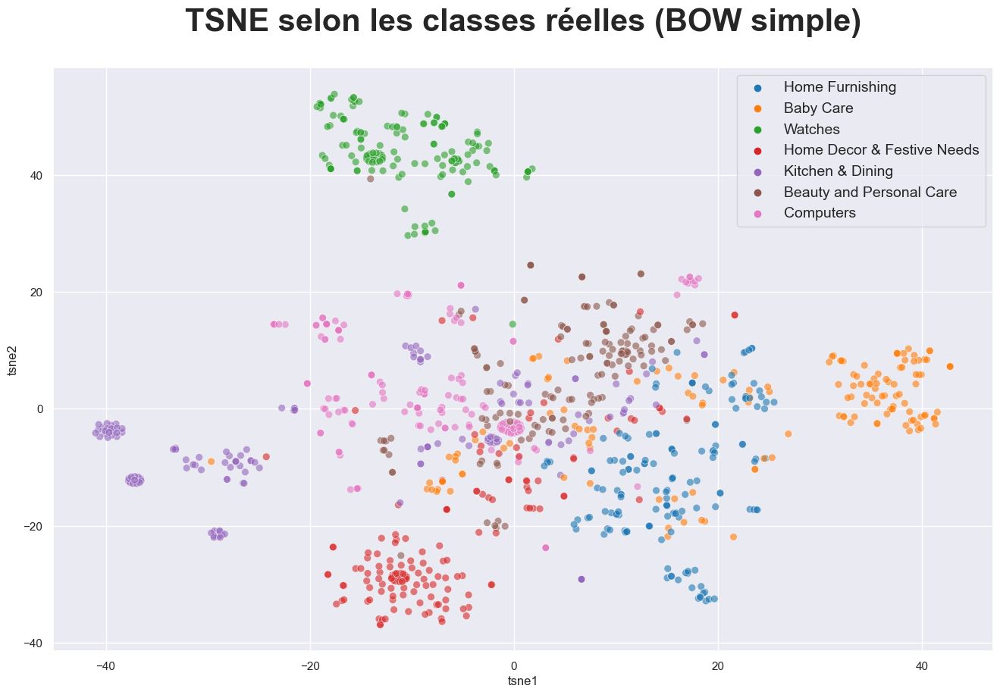

In [85]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="target",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les classes réelles (BOW simple)', fontsize = 30, pad = 35, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

Au vu de ces graphiques, je suis encore plus étonné par les piètres performances de mon premier K-Means. Le cluster "Watches", par exemple, aurait dû être détecté plus correctement. Voyons pour le score ARI

In [86]:
ARI = adjusted_rand_score(df_test["target"], df_test["predicted_cluster"])
ARI

0.16317277928753043

Comme imaginé, c'est extrêmement faible.
Essayons de faire mieux sur les prochaines vectorisations !

## 4.2 Fonction générale

Avant de passer à une deuxième vectorisation, on va écrire une fonction pour nous éviter de réécrire tout le code de la partie précédente.

In [87]:
def ARI_and_TSNE_from_features(features):
    """
    Uses a kmeans to predict 7 clusters.
    From this prediction, plot a 2D T-SNE with clusters highlighted.
    
    Also draws a second 2D plot with target highlighted, to compare with the clusters.
    
    Finally, calculates ARI score to have a metric to compare the target with the clusters predicted.
    """

    # Then, we train the K-Means algorithm
    kmeans = KMeans(n_clusters = 7)
    df_test["predicted_cluster"] = kmeans.fit_predict(features)
    
    #On affiche les effectifs de chaque cluster.
    # print(f"Affichage du nombre d'éléments par cluster :{df_test.predicted_cluster.value_counts()}")
    
    # On projette avec T-SNE
    tsne = TSNE(n_jobs = -1)
    X_tsne = tsne.fit_transform(features)
    
    #On construit le dataframe pour la visualisation
    df_tsne = pd.DataFrame(X_tsne, columns=['tsne1', 'tsne2'])
    df_tsne["class"] = df_test["predicted_cluster"]
    df_tsne["target"] = df_test["target"]
    
    #Pour le tracé :
    fig, axis = plt.subplots(2,1, figsize = (20,24),layout="constrained")
    plt.subplot(211)
    sns.scatterplot(
        x="tsne1", y="tsne2",
        hue="class",
        palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
        data=df_tsne,
        legend="brief")
    
    plt.gca().set_title('TSNE selon les prédictions', fontsize = 30, pad = 35, fontweight = 'bold')
    plt.legend(prop={'size': 18})
    
    plt.subplot(212)
    sns.scatterplot(
        x="tsne1", y="tsne2",
        hue="target",
        palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
        data=df_tsne,
        legend="brief",
        ax = axis[1])
    
    plt.gca().set_title('TSNE selon la target réelle', fontsize = 30, pad = 35, fontweight = 'bold')
    plt.legend(prop={'size': 18})
    
    plt.show()
    
    #Pour le score ARI :
    ARI = adjusted_rand_score(df_test["target"], df_test["predicted_cluster"])
    print(f"score ARI {ARI}")
    

C:\Users\Yann\AppData\Local\Temp\ipykernel_3064\2527341511.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test["predicted_cluster"] = kmeans.fit_predict(features)
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


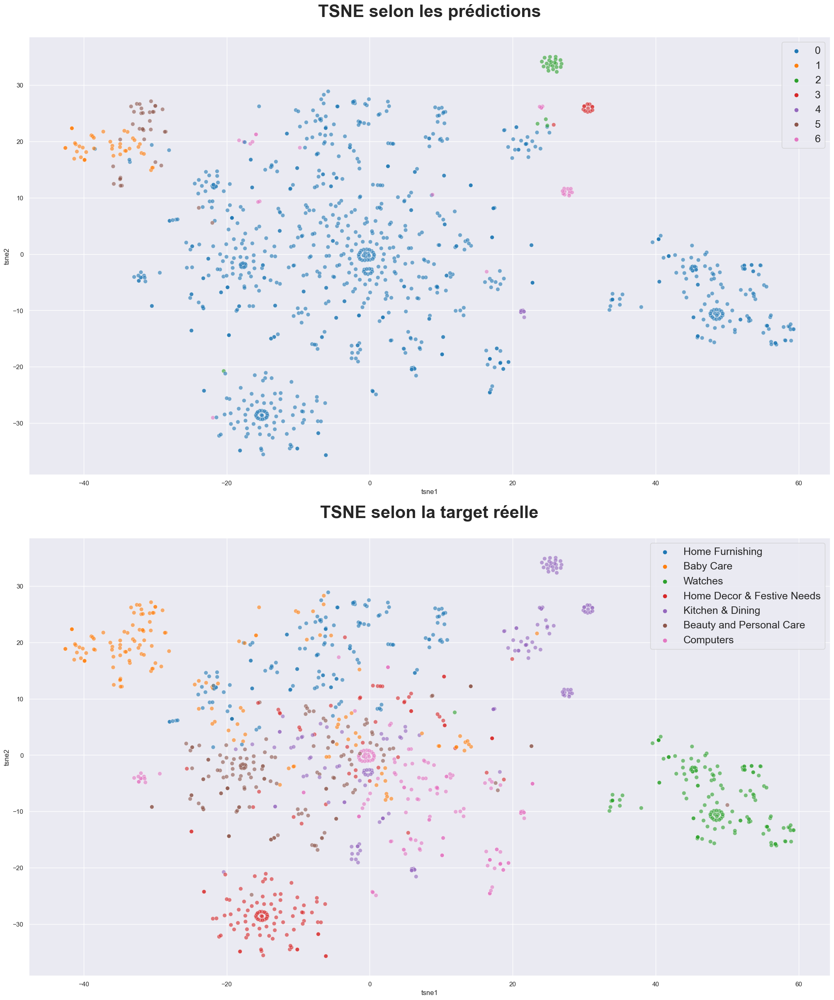

score ARI 0.02599703532041661


In [88]:
#Test avec ce qu'on connaît déjà
X = vectorizer.fit_transform(df_test["clean_description"])

ARI_and_TSNE_from_features(X) 

## 4.3 Bag-of-Words, Bigrams

In [89]:
vectorizer = CountVectorizer(ngram_range = (2,2))
X = vectorizer.fit_transform(df_test["clean_description"])

C:\Users\Yann\AppData\Local\Temp\ipykernel_3064\2527341511.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test["predicted_cluster"] = kmeans.fit_predict(features)
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


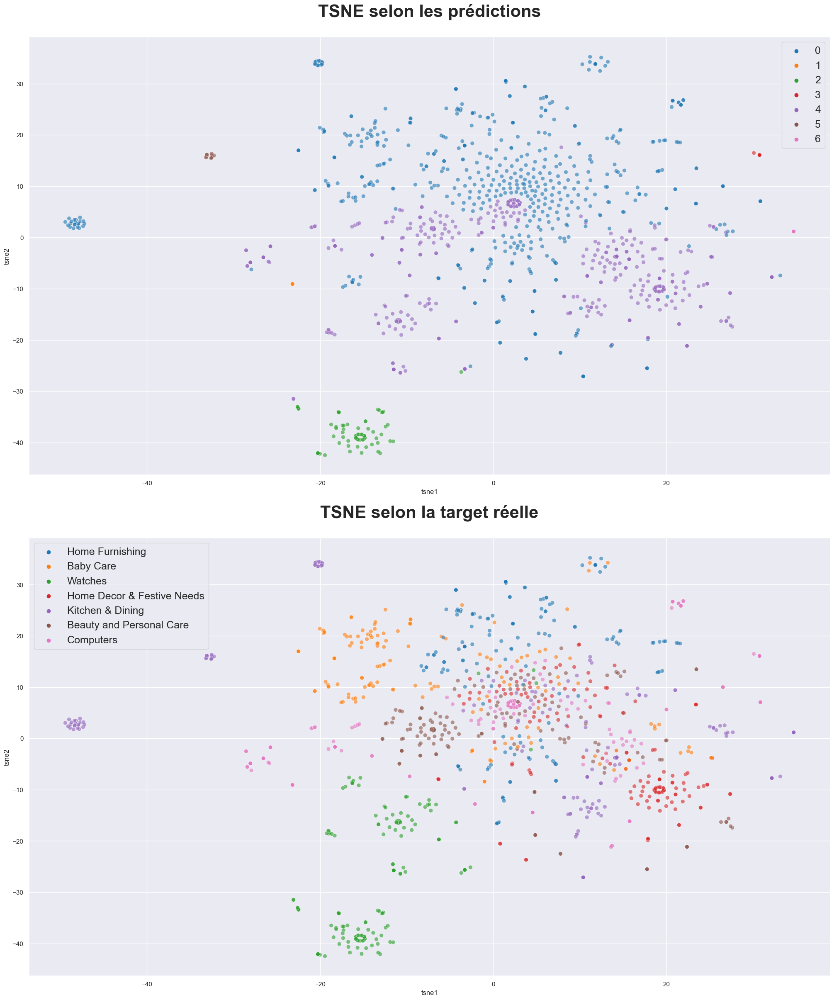

score ARI 0.11168392348126326


In [90]:
ARI_and_TSNE_from_features(X)

## 4.4 Bag-Of-Words, unigrammes ET bigrammes

C:\Users\Yann\AppData\Local\Temp\ipykernel_3064\2527341511.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test["predicted_cluster"] = kmeans.fit_predict(features)
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


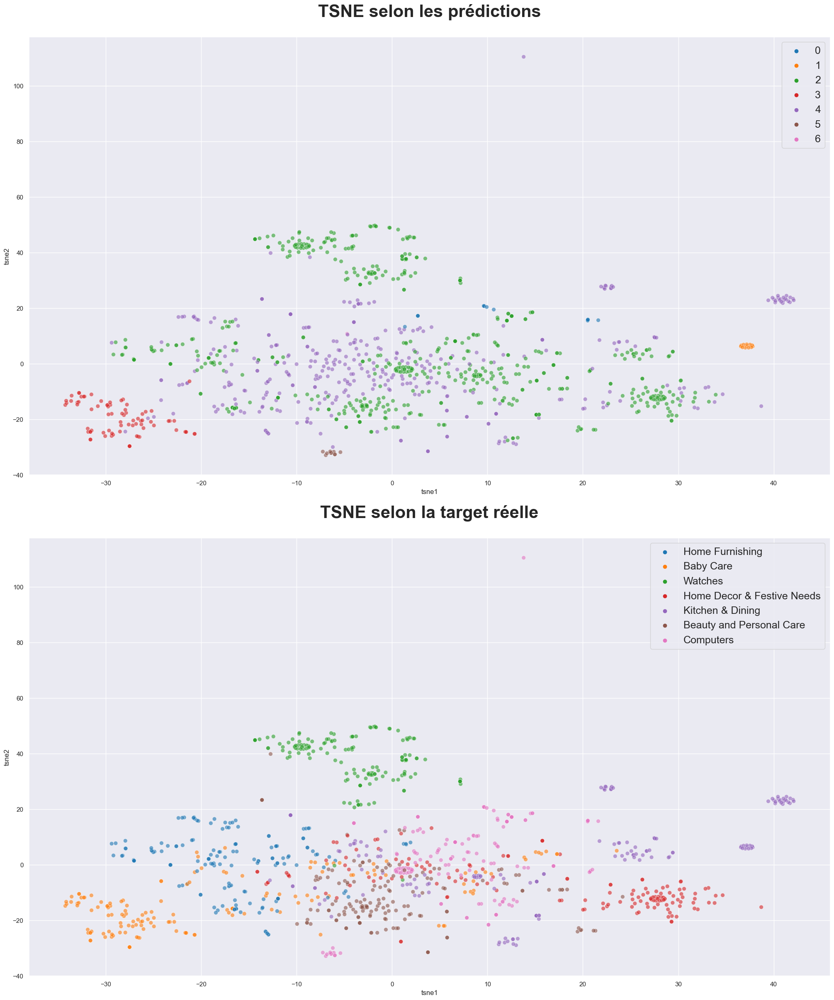

score ARI 0.06716232480816085


In [91]:
vectorizer = CountVectorizer(ngram_range = (1,2))
X = vectorizer.fit_transform(df_test["clean_description"])
ARI_and_TSNE_from_features(X)

Globalement, sur ces trois essais, on remarque que les scores ARI sont faibles. La seule catégorie réellement bien retrouvée est "Watches". Voyons si on peut améliorer.

## 4.5 Bag-of-words TF-IDF

Pour améliorer le Bag-of-words, on essaie d'utiliser le TF-IDF, qui consiste à donner moins de poids aux mots qu'on retrouve souvent dans plusieurs catégories différentes.

### 4.5.1 Monogrammes

C:\Users\Yann\AppData\Local\Temp\ipykernel_3064\2527341511.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test["predicted_cluster"] = kmeans.fit_predict(features)
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


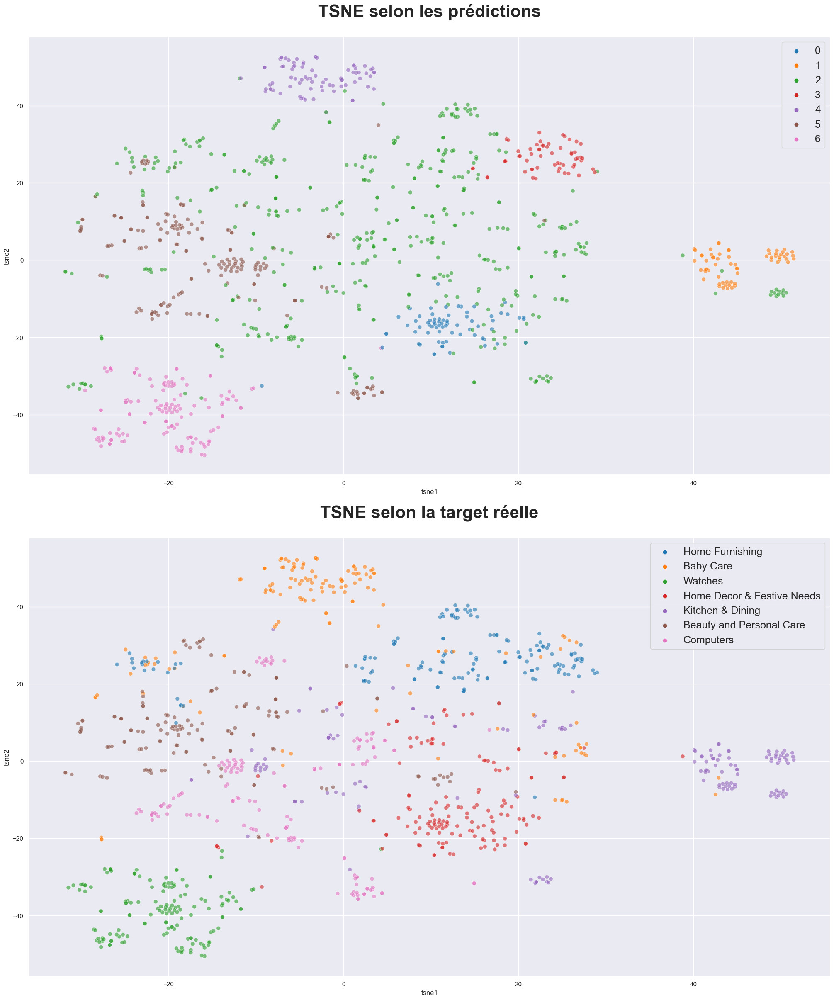

score ARI 0.23150888408776427


In [92]:
vectorizer = TfidfVectorizer(ngram_range = (1,1))
X = vectorizer.fit_transform(df_test["clean_description"])
ARI_and_TSNE_from_features(X)

C'est déjà mieux, mais ce n'est pas brillant.

### 4.5.2 Autres tests avec le tf-idf

C:\Users\Yann\AppData\Local\Temp\ipykernel_3064\2527341511.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test["predicted_cluster"] = kmeans.fit_predict(features)
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


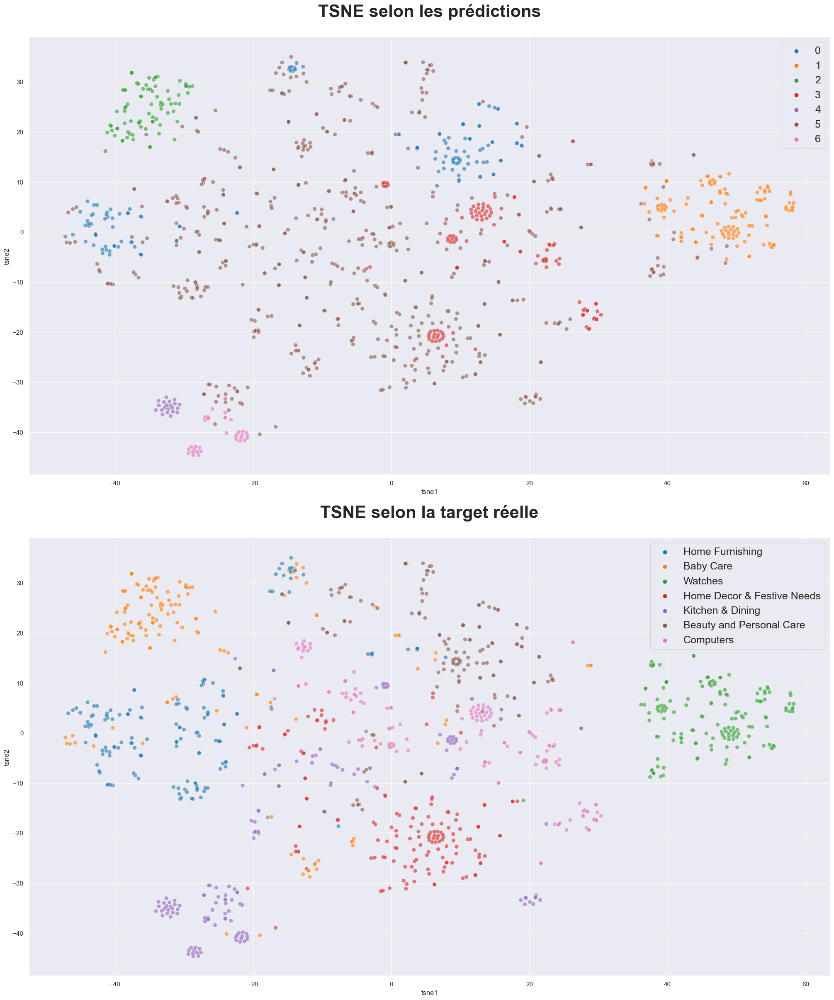

score ARI 0.16115303696218355


In [93]:
vectorizer = TfidfVectorizer(ngram_range = (1,2))
X = vectorizer.fit_transform(df_test["clean_description"])
ARI_and_TSNE_from_features(X)

Après quelques tests non affichés ici, celui-ci semble être le meilleur. 

On constate que, malgré le faible score ARI, certaines catégories sont bien détectées (Baby Care, Watches, Kitchen, Home Decor). En revanche, pour les autres, on est loin du compte.

C:\Users\Yann\AppData\Local\Temp\ipykernel_3064\2527341511.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test["predicted_cluster"] = kmeans.fit_predict(features)
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


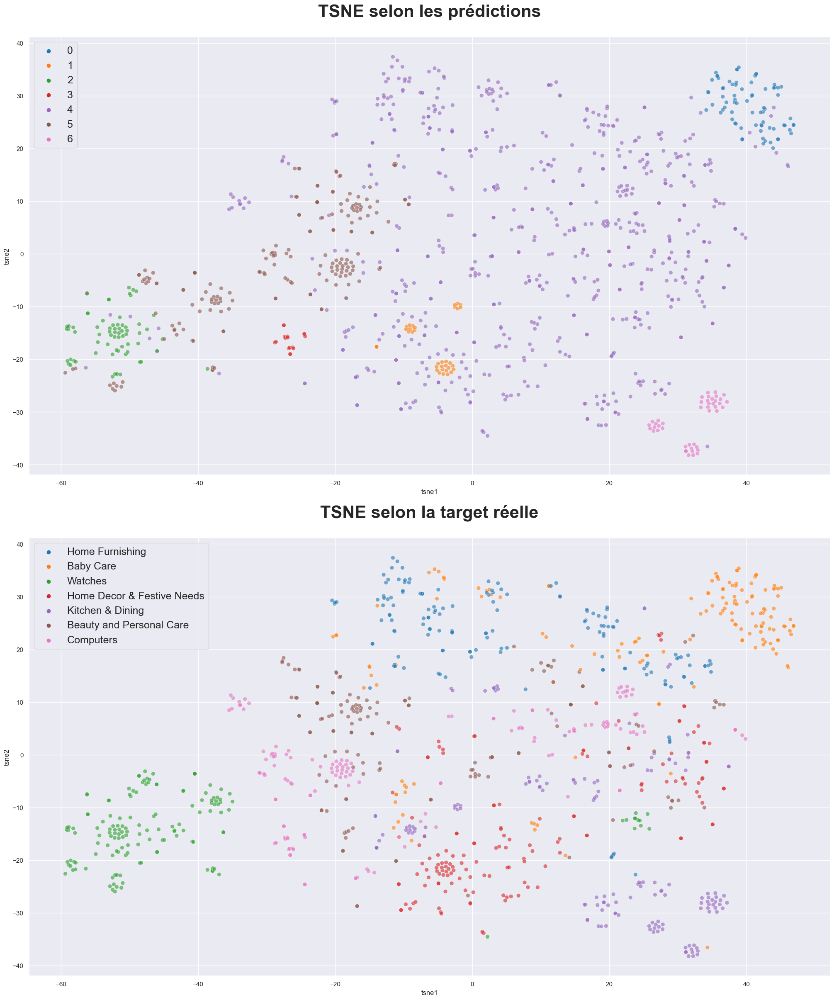

score ARI 0.11345352924272516


In [94]:
vectorizer = TfidfVectorizer(ngram_range = (2,2))
X = vectorizer.fit_transform(df_test["clean_description"])
ARI_and_TSNE_from_features(X)

Cet essai là est très peu convaincant.

Essayons autrement.

## 4.6 Avec Word2Vec

Plutôt que de compter selon les apparitions des mots, on va associer à chaque mot un vecteur particulier, indépendamment de notre corpus, appris auparavant par Word2Vec.

### 4.6.1 Entraînement sur mon corpus

In [95]:
sentences = df_test['clean_description'].to_list()
sentences = [simple_preprocess(text) for text in sentences]
sentences

[['elegance',
  'polyester',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtain',
  'key',
  'elegance',
  'polyester',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtain',
  'floral',
  'curtain',
  'elegance',
  'polyester',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtain',
  'height',
  'pack',
  'price',
  'curtain',
  'look',
  'curtain',
  'made',
  'high',
  'quality',
  'polyester',
  'fabric',
  'eyelet',
  'style',
  'metal',
  'ring',
  'room',
  'environment',
  'curtain',
  'ant',
  'wrinkle',
  'anti',
  'shrinkage',
  'elegant',
  'give',
  'home',
  'bright',
  'appeal',
  'attention',
  'sure',
  'heart',
  'contemporary',
  'eyelet',
  'smoothly',
  'draw',
  'apart',
  'first',
  'thing',
  'morning',
  'bright',
  'sun',
  'want',
  'wish',
  'good',
  'morning',
  'whole',
  'world',
  'draw',
  'evening',
  'create',
  'special',
  'beauty',
  'soothing',
  'bring',
  'home',
  'elegant',
  'curtain',
  'light',
  'room',
  '

In [97]:
w2v_model = Word2Vec(min_count = 1,
                     window=2,
                     sample=6e-5, 
                     negative=20,
                     workers=15,
                     vector_size = 300)

In [98]:
w2v_model.build_vocab(sentences)

In [99]:
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=100)

(1323378, 4245900)

In [100]:
#Je fais quelques tests pour m'assurer de ma bonne compréhension de ce qu'il se passe.

w2v_model.wv.most_similar(positive=["watch"])

[('compass', 0.9365813136100769),
 ('men', 0.9340440034866333),
 ('sonata', 0.9328847527503967),
 ('decker', 0.9070010781288147),
 ('bella', 0.9062293767929077),
 ('digital', 0.8882492184638977),
 ('maximum', 0.8780146837234497),
 ('india', 0.873931348323822),
 ('mac', 0.869439423084259),
 ('noise', 0.8686202168464661)]

In [101]:
model_vectors = w2v_model.wv
model_vectors["watch"]

array([-0.06132296,  0.31567612, -0.12327662, -0.38329282, -0.09942302,
       -0.6217022 ,  0.76062053,  0.7694779 , -0.76487905, -0.30375957,
       -0.03860119,  0.24744514,  0.02466317, -0.29736465,  0.09579632,
       -0.04351256,  0.01659274, -0.00391862,  0.2673677 , -0.13020538,
        0.19591375, -0.11773252, -0.37199807, -0.23823673, -0.00955078,
        0.10694703, -0.26161373, -0.36133245, -0.19643722, -0.16251908,
        0.21686932,  0.2574094 , -0.41881007,  0.05738291,  0.08283851,
       -0.4292334 ,  0.2818663 , -0.68145496,  0.10153052, -0.17197226,
       -0.06787774, -0.39330417,  0.31630772,  0.1974238 ,  0.20955068,
        0.25922874,  0.4697597 ,  0.260075  ,  0.4317828 , -0.0871201 ,
       -0.01671363,  0.15771663, -0.01788529, -0.13264517,  0.23062308,
        0.60418195,  0.22100319,  0.15832002, -0.12951271, -0.03891776,
        0.00217629, -0.35336983,  0.24900539,  0.10943682,  0.03026943,
        0.07589708,  0.09165516, -0.0746022 , -0.24828649, -0.05

### 4.6.2 Matrice d'embedding


In [102]:
#Je récupère ma liste de mots
w2v_words = model_vectors.index_to_key
w2v_words

['free',
 'buy',
 'replacement',
 'delivery',
 'genuine',
 'cash',
 'shipping',
 'day',
 'watch',
 'guarantee',
 'set',
 'baby',
 'mug',
 'color',
 'cotton',
 'price',
 'pack',
 'material',
 'showpiece',
 'type',
 'box',
 'ceramic',
 'general',
 'package',
 'men',
 'number',
 'design',
 'warranty',
 'quality',
 'product',
 'brand',
 'best',
 'model',
 'girl',
 'key',
 'fabric',
 'size',
 'india',
 'great',
 'multicolor',
 'made',
 'inch',
 'perfect',
 'home',
 'skin',
 'ideal',
 'coffee',
 'printed',
 'gift',
 'content',
 'black',
 'blue',
 'water',
 'print',
 'cover',
 'battery',
 'light',
 'width',
 'single',
 'adapter',
 'wash',
 'dress',
 'care',
 'also',
 'boy',
 'power',
 'double',
 'use',
 'height',
 'pattern',
 'yes',
 'high',
 'style',
 'sticker',
 'length',
 'led',
 'round',
 'one',
 'wall',
 'easy',
 'name',
 'come',
 'casual',
 'weight',
 'gold',
 'designed',
 'body',
 'give',
 'white',
 'steel',
 'dial',
 'red',
 'safe',
 'towel',
 'floral',
 'polyester',
 'brown',
 'neck'

In [103]:
#Et aussi la taille de mon vocabulaire
vocab_size = len(w2v_words) + 1
vocab_size

1560

In [104]:
# Je récupère la longueur maximale d'une phrase
maxlen = 0
for sentence in sentences:
    len_sentence = len(sentence)
    if len_sentence > maxlen:
        maxlen = len_sentence
        
maxlen

270

In [105]:
# Padding

# Avec ce tokenizer, j'ai des méthodes très pratiques pour la suite. (texts_to_sequences, word_index...)
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                                                     maxlen=maxlen,
                                                     padding='post')                                        

In [106]:
tokenizer.texts_to_sequences(sentences)

[[560,
  94,
  39,
  98,
  140,
  156,
  142,
  35,
  560,
  94,
  39,
  98,
  140,
  156,
  142,
  95,
  142,
  560,
  94,
  39,
  98,
  140,
  156,
  142,
  69,
  17,
  16,
  142,
  130,
  142,
  40,
  70,
  29,
  94,
  36,
  140,
  73,
  266,
  779,
  118,
  1202,
  142,
  1080,
  1401,
  324,
  1203,
  171,
  88,
  44,
  453,
  718,
  1081,
  226,
  719,
  561,
  140,
  1402,
  1204,
  1205,
  589,
  1403,
  301,
  453,
  780,
  949,
  1082,
  204,
  301,
  669,
  427,
  1204,
  1083,
  867,
  191,
  242,
  1404,
  149,
  44,
  171,
  142,
  57,
  118,
  128,
  436,
  1206,
  560,
  94,
  39,
  98,
  140,
  156,
  142,
  69,
  17,
  23,
  31,
  560,
  85,
  156,
  20,
  140,
  33,
  81,
  98,
  94,
  156,
  142,
  11,
  33,
  14,
  39,
  75,
  21,
  26,
  50,
  24,
  17,
  24,
  86,
  27,
  18,
  94],
 [15,
  119,
  96,
  15,
  119,
  96,
  119,
  96,
  90,
  143,
  51,
  119,
  96,
  192,
  233,
  71,
  18,
  15,
  27,
  205,
  27,
  23,
  31,
  20,
  119,
  96,
  33,
  81,
  15,


In [107]:
# Je vérifie le bon fonctionnement
x_sentences

array([[560,  94,  39, ...,   0,   0,   0],
       [ 15, 119,  96, ...,   0,   0,   0],
       [ 15, 590, 182, ...,   0,   0,   0],
       ...,
       [531, 280,  74, ...,   0,   0,   0],
       [250, 203,  74, ...,   0,   0,   0],
       [280, 203,  74, ...,   0,   0,   0]])

In [108]:
i=0
j=0
#Ces deux ajouts me permettent de savoir si mes mots correspondent bien, car j'ai eu des problèmes sur des versions précédentes

word_index = tokenizer.word_index
embedding_matrix = np.zeros((vocab_size, 300))    

for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)

Word embedding rate :  1.0


In [109]:
embedding_matrix

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.12474022,  0.23088983, -0.04404331, ..., -0.26390556,
        -0.05909171, -0.21907943],
       [-0.07453547,  0.35660213, -0.2005097 , ..., -0.05800885,
        -0.21097903, -0.13997148],
       ...,
       [-0.07252944,  0.25568229,  0.03400229, ..., -0.03780103,
         0.11248113,  0.1018789 ],
       [-0.00256867,  0.1166482 ,  0.0528521 , ..., -0.06436621,
         0.12589633,  0.04401802],
       [-0.03960268,  0.04014814, -0.04130633, ..., -0.03029643,
         0.09703381,  0.03898448]])

### 4.6.3 Modèle d'embedding

Pour ce modèle, pour être tout à fait honnête, je n'ai pas beaucoup tâtonné ou joué avec les paramètres. J'ai simplement repris celui qui m'était proposé en exemple (qui se contente essentiellement de faire entrer le bon input/output, avec une couche d'embedding).

In [110]:
len(x_sentences)

1050

In [111]:
x_sentences.shape

(1050, 270)

In [112]:
# Création du modèle

input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')  
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=300,
                         weights = [embedding_matrix],
                         input_length=maxlen)(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 270)]             0         
                                                                 
 embedding (Embedding)       (None, 270, 300)          468000    
                                                                 
 global_average_pooling1d (  (None, 300)               0         
 GlobalAveragePooling1D)                                         
                                                                 
Total params: 468000 (1.79 MB)
Trainable params: 468000 (1.79 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


### 4.6.4 Résultats

In [113]:
features_w2v = embed_model.predict(x_sentences)
features_w2v.shape

33/33 [==============================] - 0s 2ms/step


(1050, 300)

In [114]:
features_w2v

array([[-0.08445453,  0.19996816,  0.00313356, ..., -0.04437033,
         0.07858597,  0.01372309],
       [ 0.00734145,  0.02743828, -0.00966729, ..., -0.04978839,
        -0.01802143,  0.00758288],
       [ 0.01535358,  0.08193126, -0.00066773, ..., -0.10026722,
        -0.01062081, -0.01372604],
       ...,
       [-0.00133878,  0.01854676, -0.00555253, ..., -0.02892887,
        -0.01020754, -0.01261843],
       [-0.00177779,  0.02535658, -0.00586672, ..., -0.03589756,
        -0.01317807, -0.01010354],
       [-0.00305752,  0.01874281, -0.00636258, ..., -0.03041351,
        -0.01158637, -0.01109999]], dtype=float32)

C:\Users\Yann\AppData\Local\Temp\ipykernel_3064\2527341511.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test["predicted_cluster"] = kmeans.fit_predict(features)
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


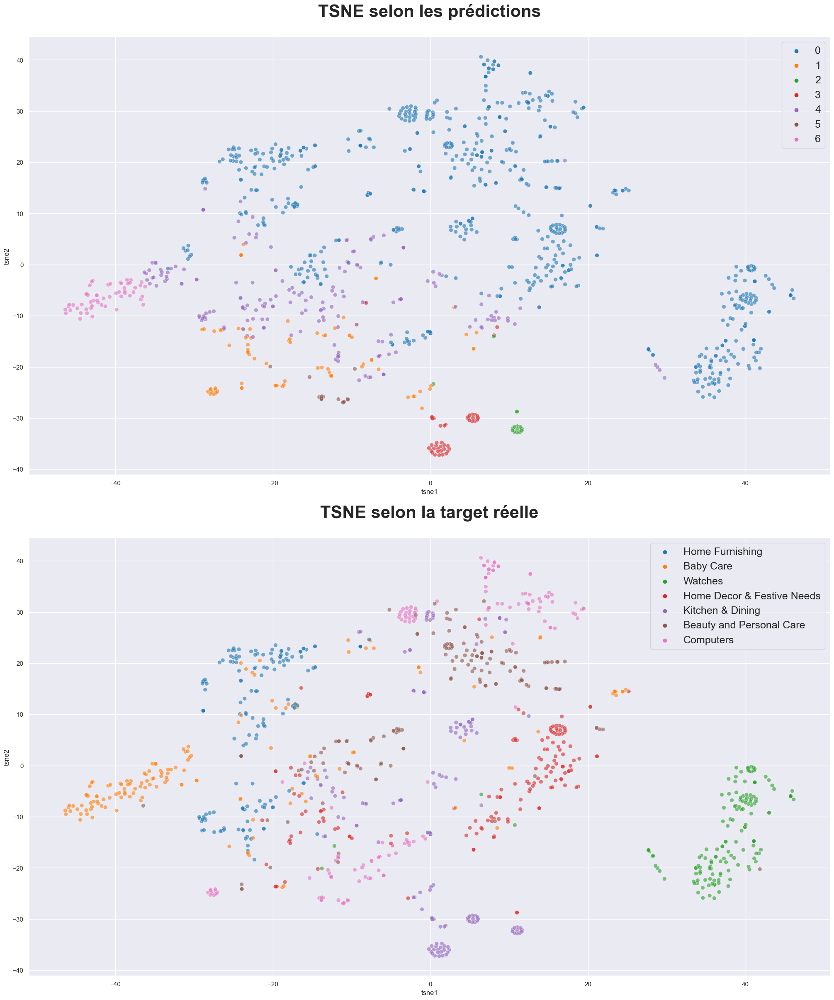

score ARI 0.04427825940322787


In [115]:
ARI_and_TSNE_from_features(features_w2v)

Le résultat est décevant. 
Je suppose que c'est dû au fait que Word2vec doit s'entraîner sur mes données, et qu'elles ne sont pas suffisamment fournies pour lui.

## 4.7 Avec BERT

Je sais qu'HuggingFace propose une version de BERT, mais dans un souci de ne pas multiplier trop de librairies (ça fait beaucoup d'un coup), je vais utiliser la version de tensorflow hub.

In [121]:
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
model = hub.KerasLayer(model_url, trainable=True)

In [122]:
sentences = df_test['clean_description'].to_list()

J'ai compris l'intérêt général et le fonctionnement dans ses grandes lignes de BERT, toutefois je n'ai pas encore bien toutes les nuances techniques. Aussi, ces prochains codes ressembleront beaucoup à l'exemple donné.

In [123]:
# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask

In [124]:
batch_size = 10
model_type = 'bert-base-uncased'
bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
t1 = time.time()
for step in range(len(sentences)//batch_size) :
    idx = step*batch_size
    input_ids, token_type_ids, attention_mask = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                             bert_tokenizer, 
                                                             maxlen)
    
    text_preprocessed = {"input_word_ids" : input_ids, 
                         "input_mask" : attention_mask, 
                         "input_type_ids" : token_type_ids}    
    
    outputs = model(text_preprocessed)
    last_hidden_states = outputs['sequence_output']
    
    if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
    else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
            
features_bert = np.array(last_hidden_states_tot).mean(axis=1)
t2 = np.round(time.time() - t1,0)
print("temps traitement : ", t2)

temps traitement :  239.0


C:\Users\Yann\AppData\Local\Temp\ipykernel_3064\2527341511.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test["predicted_cluster"] = kmeans.fit_predict(features)
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


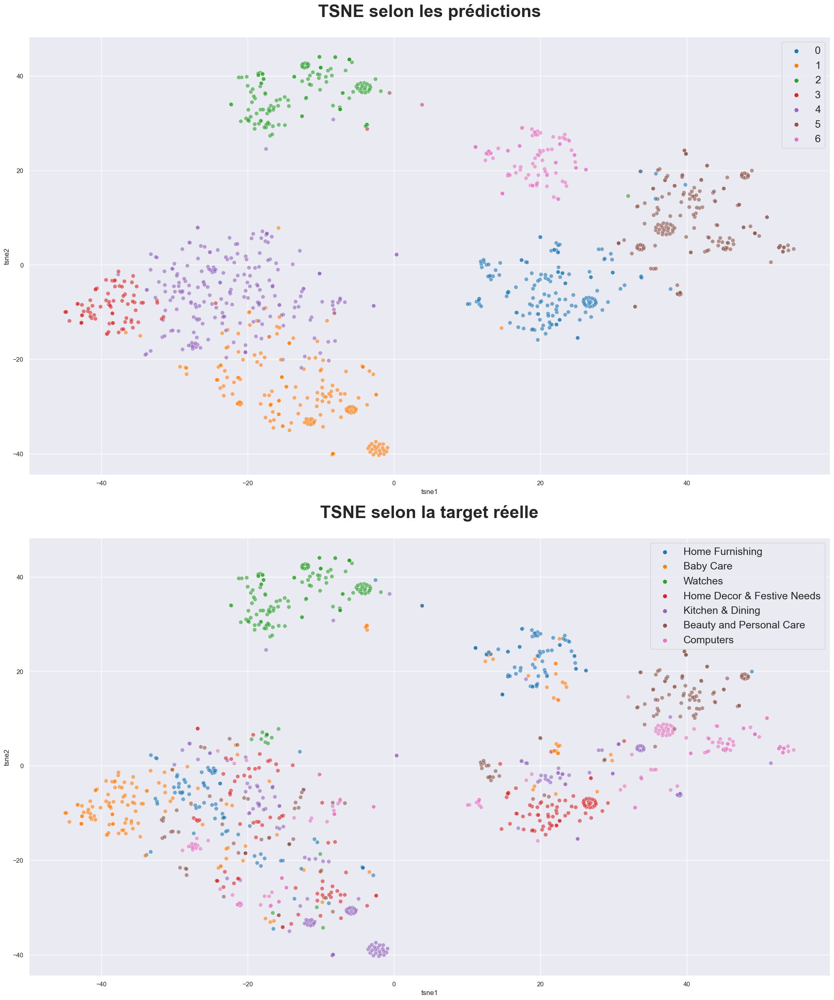

score ARI 0.27153160020473555


In [125]:
#Résultats :
ARI_and_TSNE_from_features(features_bert)

Les résultats ici sont bien meilleurs que pour l'essai avec Word2vec. Grâce au Transfer Learning, on peut profiter d'un modèle déjà entraîné en amont, et donc on souffre beaucoup moins du manque de données dans ce jeu ci.

Toutefois, on n'améliore pas vraiment les résultats obtenus avec le Tf-Idf. Ce qui me surprend beaucoup. 

## 4.8 Avec USE

In [126]:
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [127]:
def feature_USE_fct(sentences, b_size) :
    """
    extracts features from sentences using pre trained USE
    """
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features

In [128]:
batch_size = 1
sentences = df_test['clean_description'].to_list()
features_USE = feature_USE_fct(sentences, batch_size)

C:\Users\Yann\AppData\Local\Temp\ipykernel_3064\2527341511.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test["predicted_cluster"] = kmeans.fit_predict(features)
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Yann\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


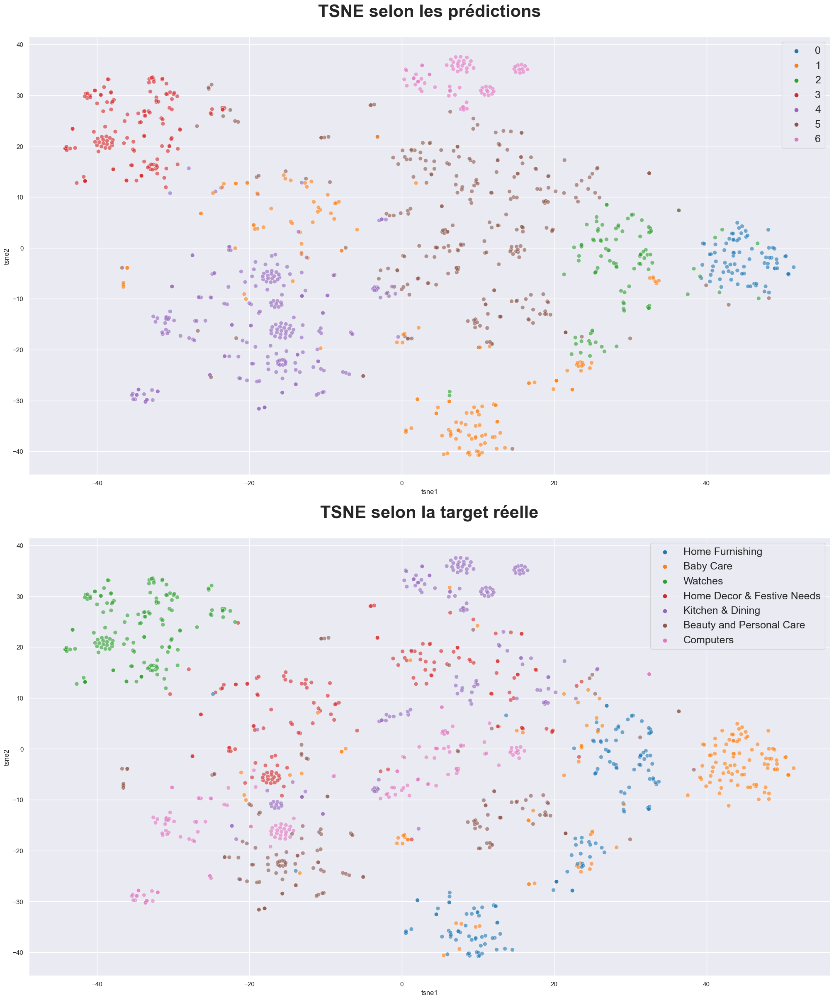

score ARI 0.32796930922428885


In [129]:
ARI_and_TSNE_from_features(features_USE)

Pour terminer, ce modèle, dernier de nos essais, semble être le meilleur, même légèrement meilleur que le Tf-Idf. 
Il parvient également à obtenir des prédictions correctes sur les 4 mêmes classes que celui-ci.

# 5. Conclusion globale

Malgré la diversité de nos approches, on ne parvient pas à obtenir un score ARI de plus de 0.3, ce qui n'est pas rien, mais très loin d'être ce qu'on recherche pour classifier à la place des êtres humains.

Toutefois, on se rend également compte que cela varie fortement en fonction des catégories étudiées. Certaines d'entre elles sont assez bien prédites, d'autres pas du tout.

Passons au prochain notebook pour voir si nous serons plus performants avec les images.

In [130]:
# df.to_csv("for_notebook_2.csv",columns = ["image","target"], index_label=False)